# 0.0 Imports and directories

In [1]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport

import os

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm

from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans, DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn import metrics
from sklearn.mixture import GaussianMixture
import umap.umap_ as umap

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

In [2]:
BASE_DIR = os.path.dirname(os.path.dirname(os.path.abspath('__file__')))
DATA_DIR = os.path.join(BASE_DIR, 'feature_eng', 'data')

# 1.0 EDA

In [3]:
df = pd.read_csv(os.path.join(DATA_DIR, 'ft_df.csv'))
full_df = pd.read_csv(os.path.join(DATA_DIR, 'full_df.csv'))

In [4]:
eda_df = df.dropna()

## 1.1 Univariate Analysis

What do we want to look at in this pandas profile?
1.  Variables with a disperse distribution (won't suit this data since it's an ecommerce dataset)
2. Metrics:
    - Min, Max, Range (dispersion)
    - Mean vs Median
    - Std and variance
    - var coef.

In [5]:
profile = ProfileReport(eda_df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 1.2 Bivariate Analysis

<Figure size 7200x2880 with 0 Axes>

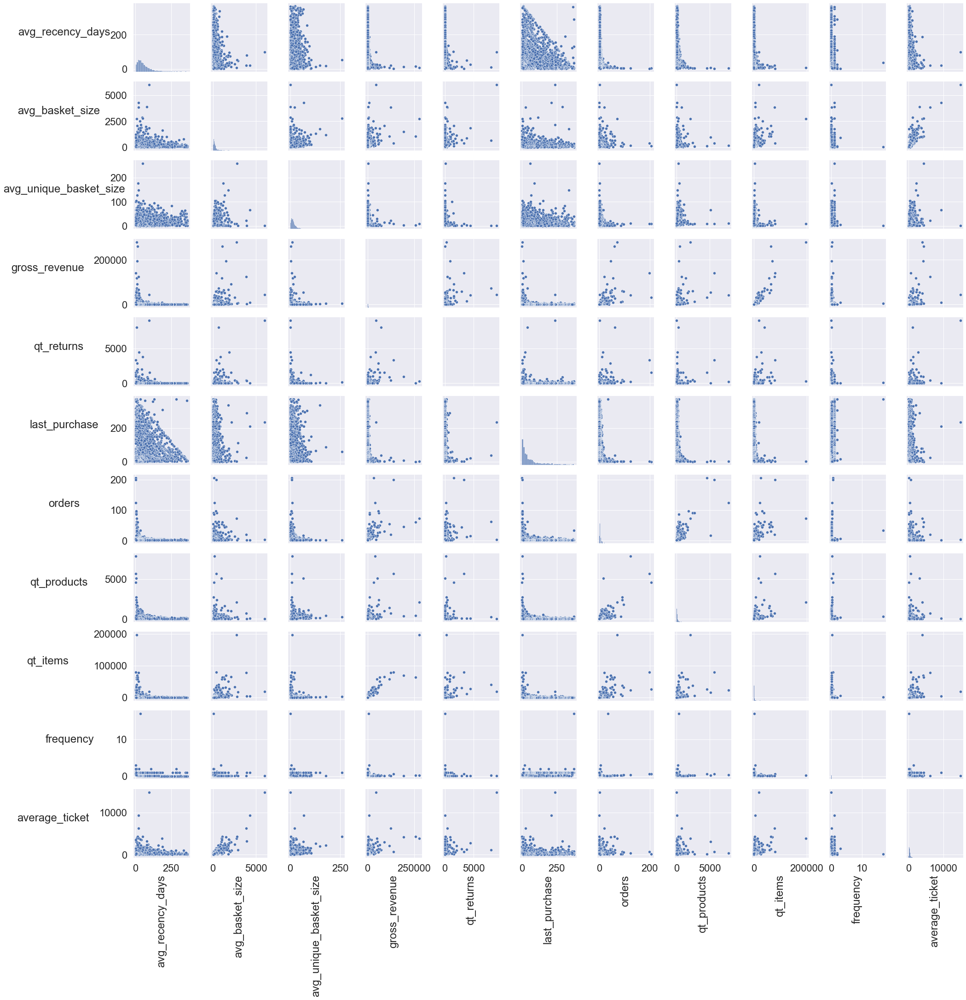

In [6]:
%matplotlib inline
plot_df = eda_df.drop(columns = 'customer_id')

plt.figure( figsize=(100, 40) )
sns.set(font_scale = 2)

g = sns.pairplot(plot_df)

for ax in g.axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.labelpad = 100

**Notes**
1. Frequency has low variance
2. Avg ticket has low variance

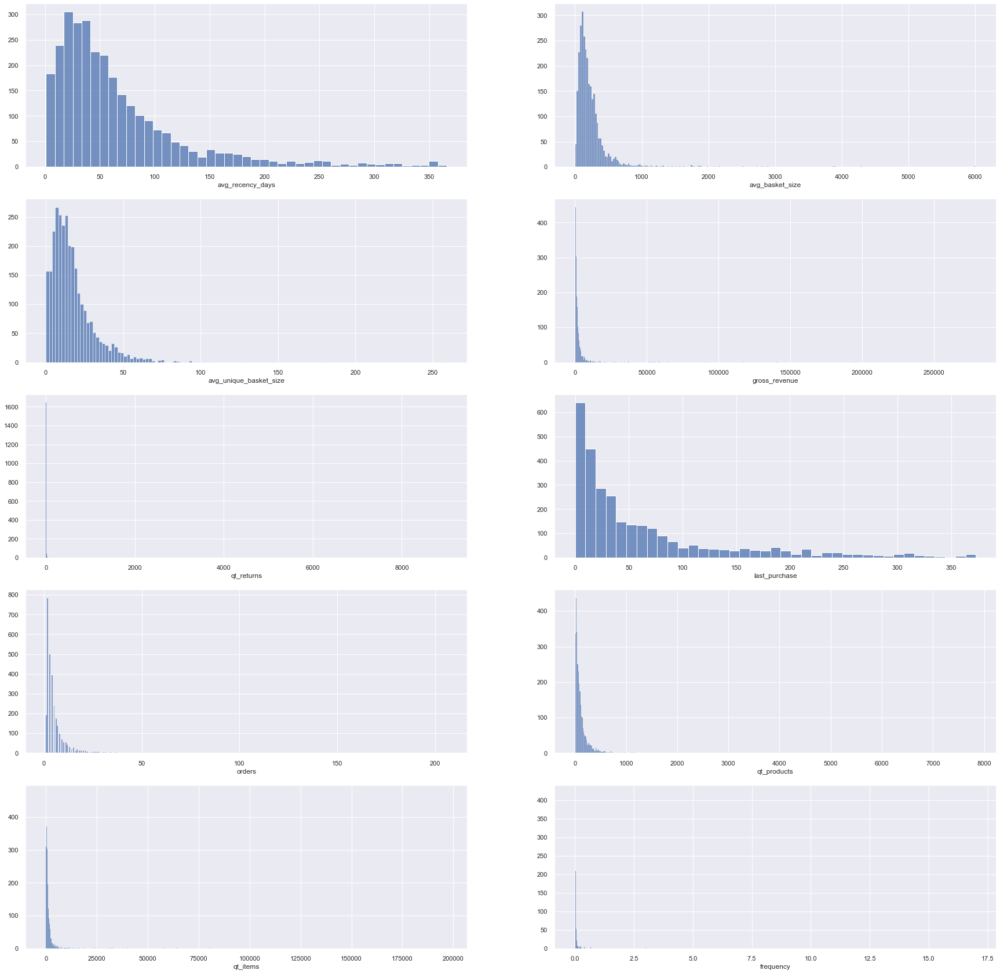

In [7]:
sns.set()

plt.figure( figsize=(30, 30) )

for i, column in enumerate(plot_df.columns, 1): 
    try: 
        plt.subplot(5,2,i) 
        sns.histplot(plot_df[column]).set(ylabel = None) 
        sns.despine(left=True) 
    except: 
        pass

Given that none of the features had a clear normal distribution and had outliers, if we were to rescale the features later on in this project, we'd be using the MinMax scaler.

## 1.3 Space study

In [8]:
cols_selected = ['gross_revenue', 'last_purchase', 'avg_recency_days','qt_products', 'qt_returns']
df = df[ ['customer_id'] + cols_selected ].dropna()
X = df[cols_selected].copy().dropna()

In [9]:
df.shape

(2968, 6)

### 1.3.1 PCA

In [10]:
scaler = MinMaxScaler()

for col in X.columns:
    X[col] = scaler.fit_transform(X[[col]])

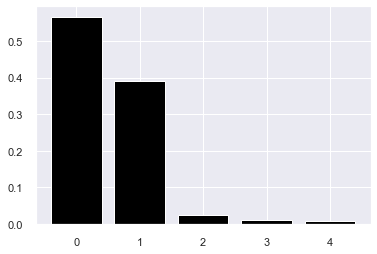

In [11]:
pca = PCA(n_components = X.shape[1])
principal_components = pca.fit_transform(X)

# plot explained variable
features = range( pca.n_components_ )

plt.bar( features, pca.explained_variance_ratio_, color='black' )

# pca component
df_pca = pd.DataFrame( principal_components )

<AxesSubplot:xlabel='0', ylabel='1'>

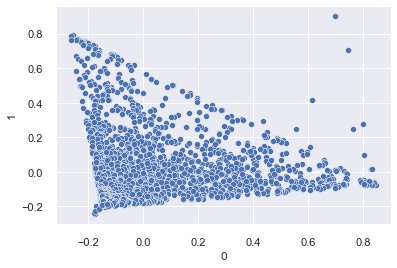

In [12]:
sns.scatterplot(x = 0, y = 1, data = df_pca)


### 1.3.2 Umap

<AxesSubplot:xlabel='embedding_x', ylabel='embedding_y'>

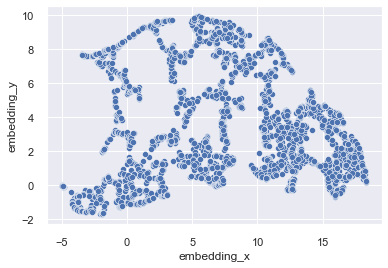

In [13]:
df_umap = pd.DataFrame()

reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( X )

# embedding
df_umap['embedding_x'] = embedding[:, 0]
df_umap['embedding_y'] = embedding[:, 1]


# plot UMAP
sns.scatterplot( x='embedding_x', 
                 y='embedding_y', 
                 data=df_umap )

### 1.3.3 TSNE

c:\users\arthu\anaconda3\envs\test\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
c:\users\arthu\anaconda3\envs\test\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


<AxesSubplot:xlabel='embedding_x', ylabel='embedding_y'>

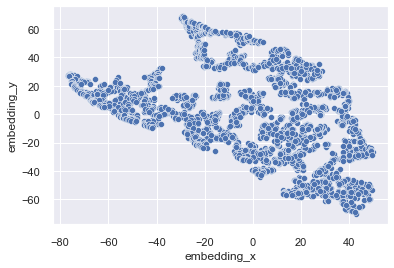

In [14]:
df_tsne = pd.DataFrame()

reducer = TSNE(n_components = 2,
                    n_jobs = -1,
                    random_state=42 )

embedding = reducer.fit_transform( X )

# embedding
df_tsne['embedding_x'] = embedding[:, 0]
df_tsne['embedding_y'] = embedding[:, 1]


# plot UMAP
sns.scatterplot( x='embedding_x', 
                 y='embedding_y', 
                 data=df_tsne )

### 1.3.4 Tree-based Embedding

In [15]:
X = df[cols_selected].drop(columns = ['gross_revenue'])
y = df.gross_revenue

In [16]:
# model definition
rf = RandomForestRegressor(n_estimators = 100, random_state=42 )

# model training
rf.fit( X, y )


# Leaf df
df_leaf = pd.DataFrame(rf.apply(X))


In [17]:
df_leaf.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,3401,2831,3726,3640,3582,3696,3572,3621,3664,3480,...,3404,3326,3374,3641,3575,3673,3675,3413,3581,3627
1,3282,2770,3688,2436,2504,2567,2681,3598,2769,3450,...,2439,3258,2322,2221,3389,2460,2784,3329,2606,3525
2,3490,2360,3697,3625,3573,3671,2761,3562,2728,3097,...,3369,3318,3492,3581,3505,3617,2632,3369,3572,3591
3,1225,824,907,370,888,506,659,1105,1884,1601,...,1205,1672,810,801,1615,1880,901,1166,961,920
4,481,416,411,894,917,803,1284,463,641,734,...,97,645,877,552,766,583,100,141,1316,26


<AxesSubplot:xlabel='embedding_x', ylabel='embedding_y'>

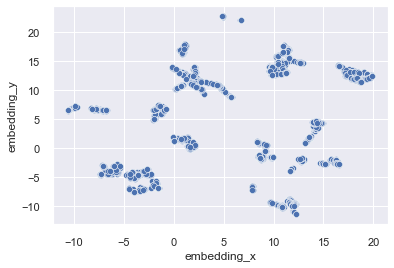

In [18]:
# Reduce dimensionality
reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( df_leaf )

# embedding
df_tree = pd.DataFrame()
df_tree['embedding_x'] = embedding[:, 0]
df_tree['embedding_y'] = embedding[:, 1]

# plot UMAP
sns.scatterplot( x='embedding_x', 
                 y='embedding_y', 
                 data=df_tree )

# 2.0 Data Prep

Features were already rescaled previously.

# 3.0 Feature Selection

Cols were already selected in the "Space Study" phase.

# 4.0 Hyperparameter Fine-Tunning

In [19]:
X = df_tree.copy()
clusters = np.arange( 2, 25, 1)

## 4.1 Kmeans

In [20]:
kmeans_list = []

for k in clusters:
    # model definition
    kmeans = KMeans( n_clusters = k , random_state = 42)

    # model training
    kmeans.fit( X )

    # model predict
    labels = kmeans.predict( X )

    # model performance
    sil = metrics.silhouette_score( X, labels, metric='euclidean' )
    kmeans_list.append( sil )

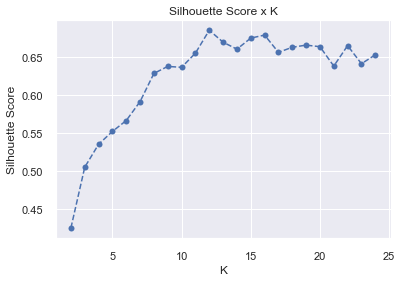

In [21]:
plt.plot( clusters, kmeans_list, linestyle='--', marker='o', color='b' )
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score x K' );

## 4.2 GMM 

In [22]:
gmm_list = []

for k in clusters:
    # model definition
    gmm = GaussianMixture(n_components = k, random_state = 42)

    # model training 
    gmm.fit(X)

    # model predict
    labels = gmm.predict(X)

    # model performance
    sil = metrics.silhouette_score( X, labels, metric='euclidean' )
    gmm_list.append( sil )

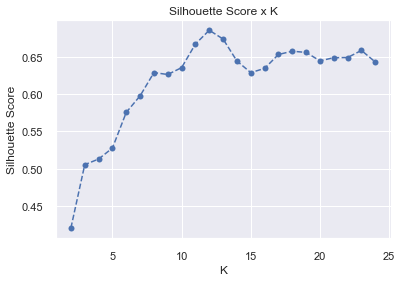

In [23]:
plt.plot( clusters, gmm_list, linestyle='--', marker='o', color='b' )
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score x K' );

## 4.3 Hierarchical Clustering

In [24]:
# model definition and training 
hc = linkage(X, 'ward')

[]

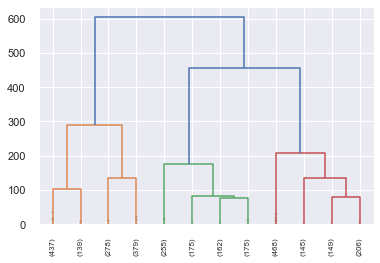

In [25]:
dendrogram(hc,
         truncate_mode = 'lastp',
         p = 12,
         leaf_rotation = 90,
         leaf_font_size = 8,
         show_contracted = True
          )

plt.plot()

### 4.3.1 HClustering Silhouette Score

In [26]:
hc_list = []
for k in clusters:

    # model training & definition
    hc = linkage(X, 'ward')

    # prediction 
    labels = fcluster( hc, k, criterion = 'maxclust' )

    # metrics
    sil = metrics.silhouette_score( X, labels, metric='euclidean' )
    hc_list.append(sil)

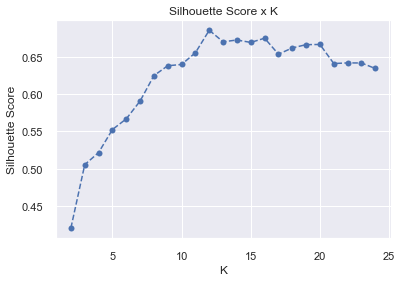

In [27]:
plt.plot( clusters, hc_list, linestyle='--', marker='o', color='b' )
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score x K' );

## 4.4 DBSCAN

In [28]:
eps = 0.2
min_samples = 10

# model defintion
db_scan = DBSCAN(eps = eps, min_samples = min_samples)

# model training
labels = db_scan.fit_predict(X)

sil = metrics.silhouette_score(X, labels, metric = 'euclidean')
print( 'Silhouette Score: {}'.format( sil ) )
print( 'Number of Clusters: {}'.format( len( np.unique( labels ) ) ) )
print( np.unique( labels ) )

Silhouette Score: 0.5590400695800781
Number of Clusters: 96
[-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46
 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70
 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94]


In [29]:
neighbors = NearestNeighbors( n_neighbors = min_samples ).fit(X)
distances, index = neighbors.kneighbors(X)

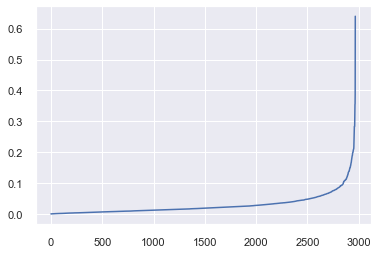

In [30]:
distances = np.sort(distances, axis = 0)[:,1]
plt.plot(distances)

## 4.5 Results

In [31]:
results = pd.DataFrame(
        {'Kmeans': kmeans_list,
        'Gmm': gmm_list,
        'HC': hc_list}
).T

results.columns = clusters

In [32]:
results.style.highlight_max(color = 'lightgreen', axis = 1)

,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
Kmeans,0.425456,0.505453,0.535648,0.552556,0.566908,0.591923,0.629010,0.638206,0.637010,0.655704,0.685860,0.670094,0.660943,0.675524,0.679485,0.656739,0.663446,0.666260,0.664194,0.638629,0.665606,0.641763,0.653486
Gmm,0.420526,0.505453,0.512956,0.527711,0.575609,0.597781,0.629010,0.626465,0.635660,0.667371,0.685860,0.674045,0.644492,0.628995,0.634645,0.653312,0.657730,0.656075,0.644803,0.649001,0.649234,0.658791,0.643210
HC,0.420526,0.505453,0.521647,0.552556,0.566908,0.590809,0.624996,0.638206,0.639922,0.655704,0.685860,0.670363,0.672756,0.669514,0.675163,0.653757,0.662112,0.666530,0.666759,0.641164,0.642021,0.641922,0.634510


# 5.0 Model Training

## 5.1 Final model

In [33]:
k = 8

## model definition
gm = KMeans( n_clusters = k, random_state = 42 ) 

# model training
gm.fit( X )

# model predict
labels = gm.predict(  X )


## 5.2 Cluster validation

In [34]:
## SS ( Silhouette Score )
print( f'''SS value: {metrics.silhouette_score( X, labels, metric='euclidean') }''')

SS value: 0.6290104985237122


# 6.0 Cluster Analysis

## 6.1 Visualization Inspection

<AxesSubplot:xlabel='embedding_x', ylabel='embedding_y'>

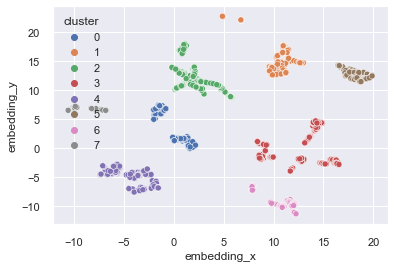

In [35]:
df_viz = X.copy()
df_viz['cluster'] = labels
sns.scatterplot( x='embedding_x', y='embedding_y', hue='cluster', data=df_viz, palette='deep')

# 7.0 Cluster Profile

In [36]:
df = df[ ['customer_id'] + cols_selected].copy()
df['cluster'] = labels
df.head()

,customer_id,gross_revenue,last_purchase,avg_recency_days,qt_products,qt_returns,cluster
0,17850,5391.21,372.0,35.500000,297.0,40.0,4
1,13047,3232.59,56.0,27.250000,171.0,35.0,7
2,12583,6705.38,2.0,23.187500,232.0,50.0,4
3,13748,948.25,95.0,92.666667,28.0,0.0,3
4,15100,876.00,333.0,8.600000,3.0,22.0,3


In [37]:
## Cluster Profile

description = df.groupby("cluster")
n_clients = description.size()
description = description.mean()
description['n_clients'] = n_clients
description['n_clients_perc'] = n_clients/n_clients.sum()*100 
description = description.drop(columns = 'customer_id')

description.sort_values('gross_revenue', ascending = False).round(2)

,gross_revenue,last_purchase,avg_recency_days,qt_products,qt_returns,n_clients,n_clients_perc
cluster,,,,,,,
4,8836.14,21.44,38.30,424.13,149.27,468,15.77
7,3164.25,34.43,50.59,173.88,23.48,145,4.89
2,2416.57,53.58,69.31,92.36,16.90,539,18.16
0,2399.57,44.45,62.68,128.20,22.32,355,11.96
1,1220.43,61.32,78.21,53.20,9.11,416,14.02
5,954.74,77.49,81.87,36.51,5.72,278,9.37
3,633.48,140.13,67.79,19.92,14.66,512,17.25
6,581.56,48.57,97.55,11.30,1.44,255,8.59


- 4 Cluster Insiders
- 7 Cluster More Products
- 2 Cluster More people
- 0 Cluster Even More Products
- 1 Cluster Less Days
- 5 Cluster Second More Sporadic Purchase
- 3 Cluster Sporadic Purchase
- 6 Cluster Buys Less

In [38]:
insiders = 4

# 8.0 Cluster EDA

## 8.1 Hypothesis Mindmap

![Hypothesis Mindmap](hypothesis_mindmap.png)

## 8.2 Business Hypothesis

### 8.2.1 Purchase Hypothesis

1. Customers in the insiders cluster use credit cards for 80% of purchases.
2. Customers in the insiders cluster have an average ticket 10% greater than More Products cluster.
3. Insiders cluster customers have a basket size above 5 products.
4. **Customers in the insiders cluster represent more than 10% of the purchases volume (products).**
5. **Customers in the insiders cluster represent more than 10% of the purchases volume (invoicing).**
6. **Insiders cluster customers have an average return amount below the average of the total return amount.**
7. **The median gross revenue of customers in the insider cluster is at least 10% higher than the median gross revenue of all customers.**
8. **The insiders cluster gross revenue is concentrated in the third quartile.**


#### H1: Customers in the insiders cluster represent more than 10% of the purchases volume (products).
**True. The insiders cluster represent approximately 54% of the purchases volume (products).**

In [39]:
perc_products = df.groupby(['cluster']).agg({'qt_products': 'sum'})
perc_products = perc_products.apply(lambda x: 100 * x / float(x.sum()))
perc_products

,qt_products
cluster,
0,12.490772
1,6.074403
2,13.662399
3,2.799391
4,54.476967
5,2.785943
6,0.790691
7,6.919435


#### H2: Customers in the insiders cluster represent more than 10% of the purchases volume (invoicing).
**True. The insiders cluster represent approximately 52% of the purchases volume (invoicing).**

In [40]:
perc_revenue = df.groupby(['cluster']).agg({'gross_revenue': 'sum'})
perc_revenue = perc_revenue.apply(lambda x: 100 * x / float(x.sum()))
perc_revenue

,gross_revenue
cluster,
0,10.655729
1,6.350770
2,16.293340
3,4.057203
4,51.728489
5,3.320094
6,1.855050
7,5.739325


#### H3: Insiders cluster customers have an average return amount below the average of the total return amount.
**False. The insiders cluster has an avg return amount of 149.27, while the avg. total return amount is 34.89**

In [41]:
insiders_return = df[df.cluster == insiders].qt_returns.mean()
returns_avg = df.qt_returns.mean()
print(f"Insiders avg return amount: {round(insiders_return, 2)}, avg return total amount: {round(returns_avg, 2)}")

Insiders avg return amount: 149.27, avg return total amount: 34.89


#### H4: The median gross revenue of customers in the insider cluster is at least 10% higher than the median gross revenue of all customers.
**True. The median gross revenue of the insiders cluster is only 276.48 % higher than all the median gross revenue.**

In [42]:
insiders_revenue = df[df.cluster == insiders].gross_revenue.median()
all_revenue = df.gross_revenue.median() 

print(f'The median gross revenue of the insiders cluster is {round((insiders_revenue/all_revenue -1) *100,2)} % higher than all the median gross revenue.')

The median gross revenue of the insiders cluster is 276.48 % higher than all the median gross revenue.


#### H5: The insiders cluster gross revenue is concentrated in the third quartile.
**False. It is concentrated in the first quartile.**

<AxesSubplot:xlabel='gross_revenue'>

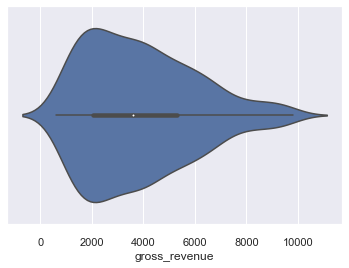

In [43]:
df_aux = df[(df['cluster'] == insiders) & (df['gross_revenue'] < 10000 )].gross_revenue
sns.violinplot( x=df_aux )

### 8.2.2 Clients Hypothesis

1. 60% of the clients in the insiders cluster have the marital status of single.
2. 10% of the clients in the insiders cluster are between the ages of 24-35.
3. 40% of the delivery locations in the insiders cluster are within a 50km radius.
4. 5% of the clients in the insiders cluster receive more than $100,000 annually.
5. 90% of the clients in the insiders cluster have completed higher education.

None of them can be tested using the final dataset.

### 8.2.3 Product Hypothesis

1. 30% of all products in large packages are purchased by the insiders cluster.
2. The average weight of products purchased by customers in the insiders cluster is greater than the average weight of the other clusters.
3. The average age of products purchased by customers in the insiders cluster is less than 15 days.

None of them can be tested using the final dataset.

## 8.3 Business Questions

### 1. Who are the people eligible to participate in the Insiders program?

In [44]:
eligible_people = df[df.cluster == insiders].customer_id
eligible_people.head()

0     17850
2     12583
6     14688
8     15311
12    16029
Name: customer_id, dtype: int64

### 2. How many customers will be part of the group?

In [45]:
len(eligible_people)

468

### 3. What are the main characteristics of these customers?

- Top revenue.
- Lowest buying lag.
- Lowest buying lag between purchases.
- Top amount of products purchased.
- Highest number of returns.
- Represent a big chunk of the client base.

### 4. What is the percentage of revenue contribution, coming from Insiders?

In [46]:
perc_revenue = perc_revenue.reset_index()
perc_revenue[perc_revenue.cluster == insiders]

,cluster,gross_revenue
4,4,51.728489


### 5. What are the conditions for a person to be eligible for Insiders?

The model will decide who is eligible.

### 6. What are the conditions for a person to be removed from Insiders?

The model will decide who is eligible.

### 7. What is the guarantee that the Insiders program is better than the rest of the base?

There's no guarantee at first, we could run an AB test to make shure that the insiders cluster performs better than the other clusters. Then, we could separate a A amount of clients from the insiders cluster and a B amount of clients from the other clusters for a specific amount of time and perform an AB testing.

### 8. What actions can the marketing team take to increase revenue?

Thinking about the insiders group, which will be the focused group in the insiders project, one could suggest the marketing team to create a VIP type service for the insiders group, this way, avoiding those clients to end up in other clusters and loosing the characteristics that fit them in the insiders cluster. 

If we think about the other clusters, one could suggest the marketing team to take one of the clusters and try to analyze what they could do to boost those clients into better groups or even improve that group itself. For example using cluster number 2 which contains the biggest chunk of clients of the whole base, and trying to make those clients buy more products could result in a revenue increase. Maybe one could suggest the marketing team to create a sort of cross sell strategy with those clients.